In [18]:
import numpy as np 
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import pickle

In [19]:
penguins_df = pd.read_csv("noisy_datasets/penguins.csv")
print("Penguin Data \n", penguins_df.describe())
print(penguins_df.count())
print(penguins_df.columns.tolist())
penguins_df.info()
penguins_df = penguins_df.dropna(subset=['species', 'island', 'gender'])
penguins_df = penguins_df.fillna(penguins_df.select_dtypes(include='number').mean())
penguins_df[['species', 'island', 'gender']] = penguins_df[['species', 'island', 'gender']].applymap(str.lower)
Q1 = penguins_df.select_dtypes(include='number').quantile(0.25)
Q3 = penguins_df.select_dtypes(include='number').quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = pd.DataFrame(False, index=penguins_df.index, columns=penguins_df.columns)
for column in penguins_df.select_dtypes(include='number').columns:
    outliers[column] = (penguins_df[column] < lower_bound[column]) | (penguins_df[column] > upper_bound[column])
for column in penguins_df.select_dtypes(include='number').columns:
    penguins_df[column] = penguins_df[column].where(~outliers[column], penguins_df[column].median())

print("Penguin Data \n", penguins_df.describe())
penguins_df = pd.get_dummies(penguins_df, columns=['species', 'island'], drop_first=False)
penguins_df['gender_target'] = penguins_df['gender'].map({'female': 0, 'male': 1})
penguins_df = penguins_df.drop('gender', axis=1)
correlation_matrix = penguins_df.corr()
target_correlation = correlation_matrix['gender_target']
print(target_correlation)
threshold = 0.1 
low_correlation_features = target_correlation[target_correlation.abs() < threshold].index.tolist()
print(low_correlation_features)
corelated_df = penguins_df.drop(columns=low_correlation_features)
corelated_df.head(5)
non_categorical_columns = ['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']
min_values = corelated_df[non_categorical_columns].min()
max_values = corelated_df[non_categorical_columns].max()
corelated_df[non_categorical_columns] = (corelated_df[non_categorical_columns] - min_values) / (max_values - min_values)

Penguin Data 
        calorie requirement  average sleep duration  bill_length_mm  \
count           344.000000              344.000000      337.000000   
mean           5270.002907               10.447674       45.494214   
std            1067.959116                2.265895       10.815787   
min            3504.000000                7.000000       32.100000   
25%            4403.000000                9.000000       39.500000   
50%            5106.500000               10.000000       45.100000   
75%            6212.750000               12.000000       49.000000   
max            7197.000000               14.000000      124.300000   

       bill_depth_mm  flipper_length_mm  body_mass_g         year  
count     333.000000         336.000000   339.000000   342.000000  
mean       18.018318         197.764881  4175.463127  2008.035088  
std         9.241384          27.764491   858.713267     0.816938  
min        13.100000          10.000000   882.000000  2007.000000  
25%        15.

In [20]:
class Logit_Regression():
    def __init__(self, learning_rate, iterations_count):
        self.learning_rate = learning_rate
        self.iterations_count = iterations_count
        self.weights = None
        self.loss = []
        self.bias = None

    def sigmoid(self, z):
        return 1 / (1 + np.exp(-z))
    
    def cost(self, y, y_hat):
        N = len(y)
        return (1/N) * np.sum(-y * np.log(y_hat) - (1 - y) * np.log(1 - y_hat))
    
    def gradient_descent(self,X, y):
        N = len(y)
        z = np.dot(X, self.weights) + self.bias
        y_hat = self.sigmoid(z)
        delta = y_hat - y
        x_trans = np.transpose(X)
        dW = np.dot(x_trans,delta)/N
        db = np.sum(delta)/N
        self.bias = self.bias - self.learning_rate*db
        self.weights = self.weights - self.learning_rate*dW
        return self.weights, y_hat

    def fit(self,X,y):
        self.weights = np.random.uniform(0, 1, size=(X.shape[1], 1))
        self.bias = 0
        for i in range(self.iterations_count):
            self.weights, y_hat = self.gradient_descent(X,y)
            c = self.cost(y, y_hat)
            self.loss.append(c)
            print(f"Iteration {i}:\nLoss is {c}\n")

    def predict(self, X):
        z = np.dot(X, self.weights) + self.bias
        y_hat = self.sigmoid(z)
        return y_hat
    
    def accuracy(self, y, y_hat):
        y_hat_bin = (y_hat > 0.5).astype(int)
        y_bin = (y > 0.5).astype(int)
        predictions = np.sum(y_hat_bin == y_bin)
        acc = predictions / len(y)
        return acc
    
    def loss_graph(self):
        plt.plot(range(self.iterations_count), self.loss)
        plt.xlabel('Iterations')
        plt.ylabel('Loss')
        plt.title('Loss Over Iterations')
        plt.show()
    
    def save_model_to_pickle(model, filename="model_weights.pkl"):
        with open(filename, 'wb') as f:
            pickle.dump({'weights': model.weights, 'bias': model.bias}, f)
        print(f"Model weights saved to {filename}")




X_train shape: (248, 4)
y_train shape: (248, 1)
X_test shape: (63, 4)
y_test shape: (63, 1)
Iteration 0:
Loss is 0.7642528250987414

Iteration 1:
Loss is 0.7641528087964661

Iteration 2:
Loss is 0.7640528508520842

Iteration 3:
Loss is 0.7639529512449947

Iteration 4:
Loss is 0.7638531099545882

Iteration 5:
Loss is 0.7637533269602473

Iteration 6:
Loss is 0.7636536022413453

Iteration 7:
Loss is 0.7635539357772473

Iteration 8:
Loss is 0.7634543275473099

Iteration 9:
Loss is 0.7633547775308814

Iteration 10:
Loss is 0.7632552857073014

Iteration 11:
Loss is 0.7631558520559009

Iteration 12:
Loss is 0.7630564765560031

Iteration 13:
Loss is 0.7629571591869221

Iteration 14:
Loss is 0.7628578999279642

Iteration 15:
Loss is 0.762758698758427

Iteration 16:
Loss is 0.7626595556575997

Iteration 17:
Loss is 0.7625604706047636

Iteration 18:
Loss is 0.7624614435791912

Iteration 19:
Loss is 0.7623624745601469

Iteration 20:
Loss is 0.762263563526887

Iteration 21:
Loss is 0.76216471045865

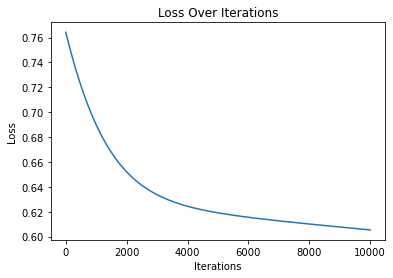

Test Accuracy 1:  79.36507936507937


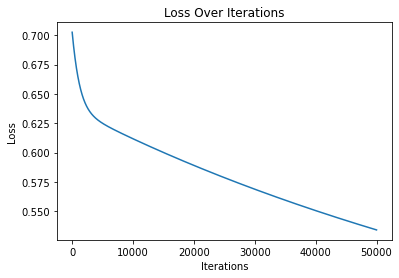

Test Accuracy 2:  90.47619047619048


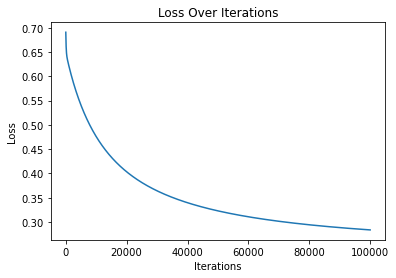

Best Accuracy:  90.47619047619048
Model weights saved to model_weights.pkl


In [21]:
X = corelated_df[['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g']].values
y = corelated_df['gender_target'].values.reshape(-1, 1) 
N = X.shape[0] 
train_size = int(0.8 * N) 
index_number = np.arange(N)
np.random.shuffle(index_number)
train_indices = index_number[:train_size]
test_indices = index_number[train_size:]
X_train = X[train_indices]
y_train = y[train_indices]
X_test = X[test_indices]
y_test = y[test_indices]
min_values_x = X_train.min(axis=0)
max_values_x = X_train.max(axis=0)
min_values_xt = X_test.min(axis=0)
max_values_xt = X_test.max(axis=0)
min_values_y = y_train.min(axis = 0)
max_values_y = y_train.max(axis = 0)
min_values_yt = y_test.min(axis = 0)
max_values_yt = y_test.max(axis = 0)
X_train = (X_train - min_values_x) / (max_values_x - min_values_x)
X_test = (X_test - min_values_xt) / (max_values_xt - min_values_xt)
y_train = (y_train - min_values_y) / (max_values_y - min_values_y)
y_test = (y_test - min_values_yt) / (max_values_yt - min_values_yt)
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

learning_rate_0 = 0.001
iterations_count_0 = 10000
model_0 = Logit_Regression(learning_rate_0, iterations_count_0)
model_0.fit(X_train, y_train)
y_pred_0 = model_0.predict(X_test)
test_accuracy_0 = model_0.accuracy(y_test, y_pred_0)

learning_rate = 0.001
iterations_count = 50000
model = Logit_Regression(learning_rate, iterations_count)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
test_accuracy = model.accuracy(y_test, y_pred)

learning_rate_1 = 0.01
iterations_count_1 = 100000
model_1 = Logit_Regression(learning_rate_1, iterations_count_1)
model_1.fit(X_train, y_train)
y_pred_1 = model_1.predict(X_test)
test_accuracy_1 = model_1.accuracy(y_test, y_pred_1)


print(f"Test Accuracy 0: ",test_accuracy_0 * 100)
model_0.loss_graph()
print(f"Test Accuracy 1: ",test_accuracy * 100)
model.loss_graph()
print(f"Test Accuracy 2: ",test_accuracy_1 * 100)
model_1.loss_graph()

best_acc = max(test_accuracy, test_accuracy_1, test_accuracy_0)
print(f"Best Accuracy: ",best_acc * 100)
if best_acc == test_accuracy:
    Logit_Regression.save_model_to_pickle(model, filename="mythrish_ruthvikv_assignment1_part2.pkl")
elif best_acc == test_accuracy_1:
    Logit_Regression.save_model_to_pickle(model_1, filename="mythrish_ruthvikv_assignment1_part2.pkl")
else: 
    Logit_Regression.save_model_to_pickle(model_0, filename="mythrish_ruthvikv_assignment1_part2.pkl")